+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+




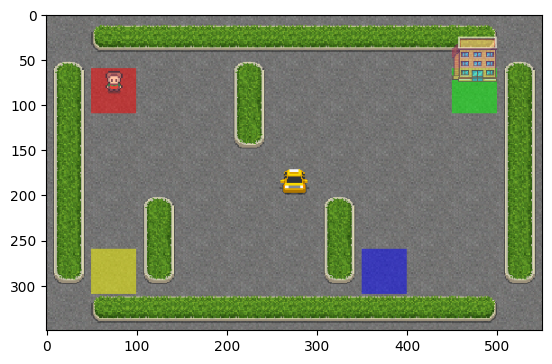

In [1]:
import numpy as np
import gym
import matplotlib.pyplot as plt
# Render in ANSI mode
ansi_env = gym.make('Taxi-v3', render_mode='ansi')
state = ansi_env.reset()
rendered_env_ansi = ansi_env.render()
print(rendered_env_ansi)

# Render in RGB array mode
rgb_env = gym.make('Taxi-v3', render_mode='rgb_array')
state = rgb_env.reset()
rendered_env_rgb = rgb_env.render()

# Plot the RGB rendered environment
plt.imshow(rendered_env_rgb)
plt.show()


In [2]:
state

(241, {'prob': 1.0, 'action_mask': array([1, 1, 1, 1, 0, 0], dtype=int8)})

## Initialisation

In [3]:
# Initialize the environment
env = gym.make('Taxi-v3')
state_size = env.observation_space.n
action_size = env.action_space.n
Q = np.zeros((state_size, action_size))
Q

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

## Q-learning

G:\python\python3.10\lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Episode: 100, Total Reward: 3
Episode: 200, Total Reward: -11
Episode: 300, Total Reward: 8
Episode: 400, Total Reward: 5
Episode: 500, Total Reward: 10
Episode: 600, Total Reward: 5
Episode: 700, Total Reward: 13
Episode: 800, Total Reward: 7
Episode: 900, Total Reward: 11
Episode: 1000, Total Reward: 10
Episode: 1100, Total Reward: 7
Episode: 1200, Total Reward: 7
Episode: 1300, Total Reward: 9
Episode: 1400, Total Reward: 12
Episode: 1500, Total Reward: 6
Episode: 1600, Total Reward: -4
Episode: 1700, Total Reward: -3
Episode: 1800, Total Reward: 9
Episode: 1900, Total Reward: 6
Episode: 2000, Total Reward: 9
Average reward:7.198
Average steps:13.388


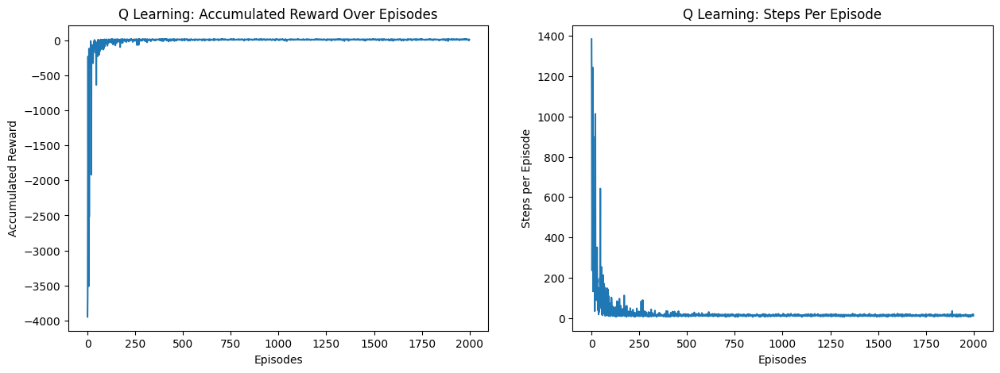

In [4]:
import gym
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
# Initialize the environment
env = gym.make('Taxi-v3')
state_size = env.observation_space.n
action_size = env.action_space.n
Q = np.zeros((state_size, action_size))
# Hyperparameters
alpha = 0.9  # Learning rate
gamma = 0.9  # Discount factor
tau = 0.01  # Exploration rate
episodes = 2000  # Number of episodes

# Tracking rewards and steps
rewards = []
steps = []

# Define the epsilon-greedy policy
def epsilon_greedy_action(state, Q, tau):
    if np.random.uniform(0, 1) < tau:
        action = env.action_space.sample()  
    else:
        action = np.argmax(Q[state])
    return action

# Q-table function
def update_q_table(Q, state, action, reward, next_state, alpha, gamma):
    Q[state, action] = Q[state, action] + alpha * (reward + gamma * np.max(Q[next_state]) - Q[state, action])
    return Q

# Train agent
def train_agent(episodes, alpha, gamma, tau, Q):
    rewards = []
    steps = []
    for episode in range(1, episodes + 1):
        state,info = env.reset()
        done = False
        G, reward = 0, 0
        step_count = 0

        # Choose initial action
        action = epsilon_greedy_action(state, Q, tau)

        while not done:
            next_state, reward, done, truncated, info = env.step(action)
            
            # Choose next action
            next_action = epsilon_greedy_action(next_state, Q, tau)

            # Update Q-table
            Q = update_q_table(Q, state, action, reward, next_state, alpha, gamma)

            G += reward
            state = next_state
            action = next_action
            step_count += 1

        rewards.append(G)
        steps.append(step_count)

        # Logging rewards at intervals
        if episode % 100 == 0:
            print(f"Episode: {episode}, Total Reward: {G}")

    return Q, rewards, steps

# Train the agent and plot results
Q, rewards, steps = train_agent(episodes, alpha, gamma, tau, Q)
print(f"Average reward:{np.mean(rewards[1000:])}")
print(f"Average steps:{np.mean(steps[1000:])}")
# Save the Q-table to a CSV file
pd.DataFrame(Q).to_csv('q_learning_q_table.csv', index=False)

# Plotting the results
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Plot Accumulated Reward over Episodes
axs[0].plot(rewards)
axs[0].set_xlabel('Episodes')
axs[0].set_ylabel('Accumulated Reward')
axs[0].set_title('Q Learning: Accumulated Reward Over Episodes')

# Plot Steps per Episode
axs[1].plot(steps)
axs[1].set_xlabel('Episodes')
axs[1].set_ylabel('Steps per Episode')
axs[1].set_title('Q Learning: Steps Per Episode')

plt.show()

## Visualize and Test(ansi)

In [10]:
import pandas as pd
import gym
import numpy as np

# Load the Q-table
Q = pd.read_csv('q_learning_q_table.csv').values

# Initialize the environment
env = gym.make('Taxi-v3', render_mode='ansi')

# Define a function to run and visualize test episodes
def run_and_visualize_test_episodes(env, Q, num_episodes=100, max_visualize_steps=20):
    rewards = []
    steps = []
    for episode in range(num_episodes):
        state, info = env.reset()
        done = False
        total_reward = 0
        step_count = 0

        if episode == 0:
            print(f"Episode {episode + 1}\n{'='*20}")

        while not done:
            action = np.argmax(Q[state])
            next_state, reward, done, truncated, info = env.step(action)
            total_reward += reward
            step_count += 1

            if episode == 0 and step_count <= max_visualize_steps:
                # Render the environment and print the step details
                rendered_env = env.render()
                print(rendered_env)
                print(f"Step: {step_count}")
                print(f"State: {state}, Action: {action}, Reward: {reward}, Total Accumulated Reward: {total_reward}\n")

            state = next_state

        rewards.append(total_reward)
        steps.append(step_count)

        if episode == 0:
            print(f"Total Reward for Episode {episode + 1}: {total_reward}")
            print('='*20)

        print(f"Episode {episode + 1}: Total Reward = {total_reward}")

    # Print average reward and steps
    print(f"Average reward over {num_episodes} episodes: {np.mean(rewards)}")
    print(f"Average steps per episode over {num_episodes} episodes: {np.mean(steps)}")

# Test the Q-learning Q-table
print("Testing Q-learning Q-table")
run_and_visualize_test_episodes(env, Q)


Testing Q-learning Q-table
Episode 1
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (North)

Step: 1
State: 327, Action: 1, Reward: -1, Total Accumulated Reward: -1

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (East)

Step: 2
State: 227, Action: 2, Reward: -1, Total Accumulated Reward: -2

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (East)

Step: 3
State: 247, Action: 2, Reward: -1, Total Accumulated Reward: -3

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (East)

Step: 4
State: 267, Action: 2, Reward: -1, Total Accumulated Reward: -4

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (North)

Step: 5
State: 287, Action: 1, Reward: -1, Total Accumulated Reward: -5

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (North)

Step: 6
State: 187, Action: 1, 

G:\python\python3.10\lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


### RGB_array Model


North


G:\python\python3.10\lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


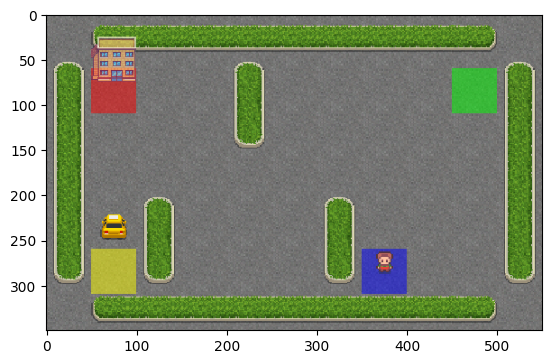


North


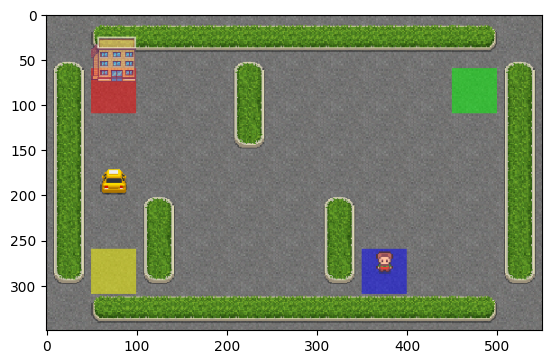


East


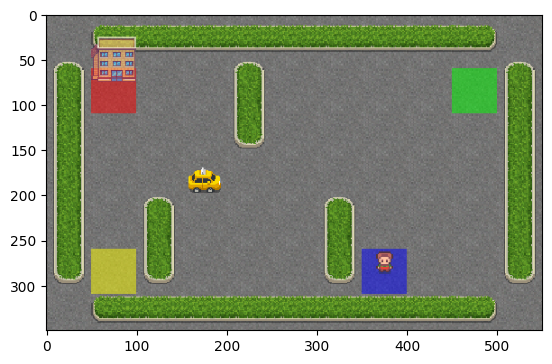


East


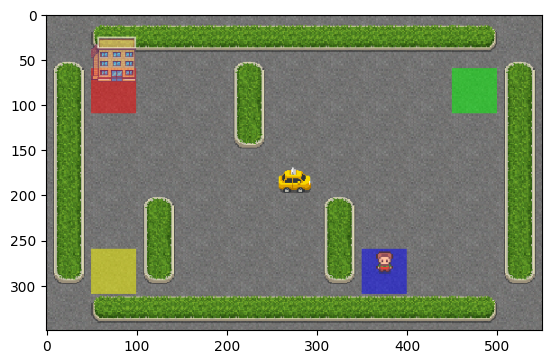


East


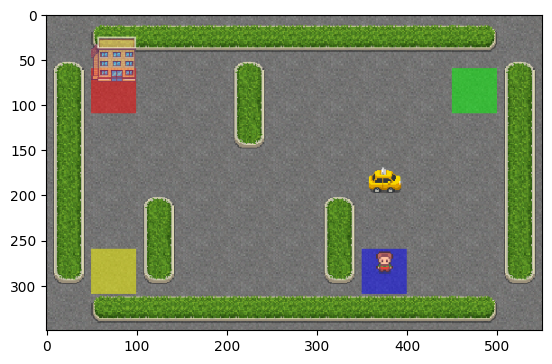


South


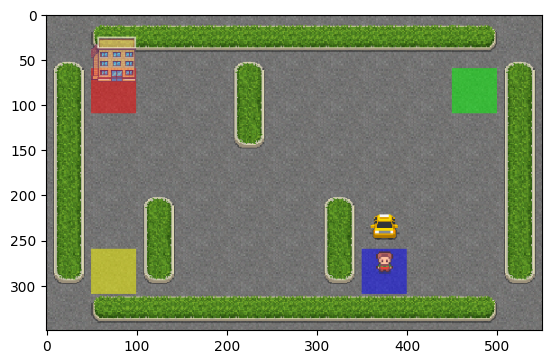


South


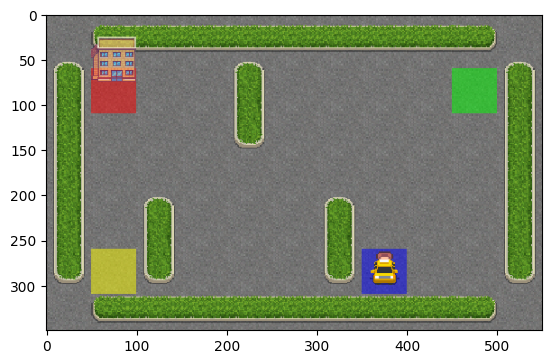


Pick Up


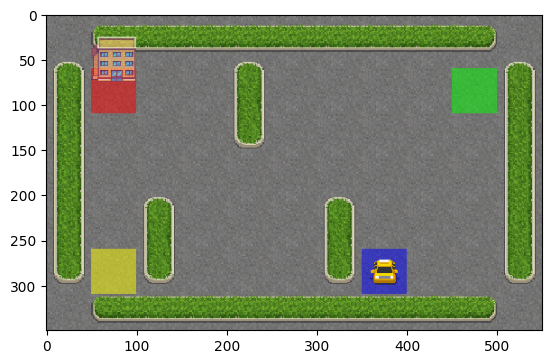


North


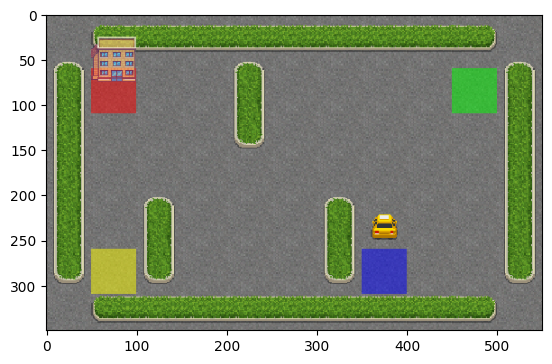


North


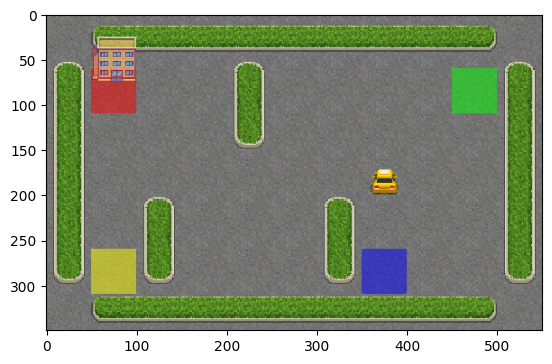


West


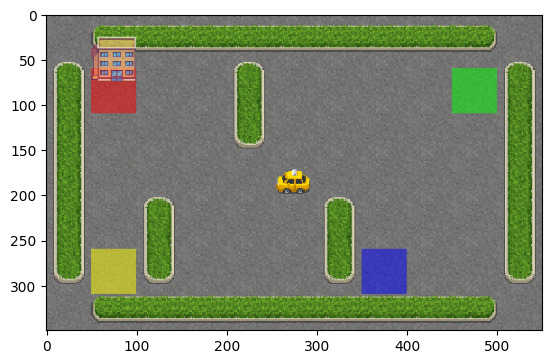


West


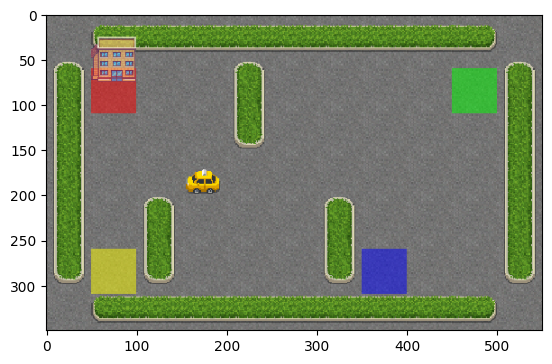


North


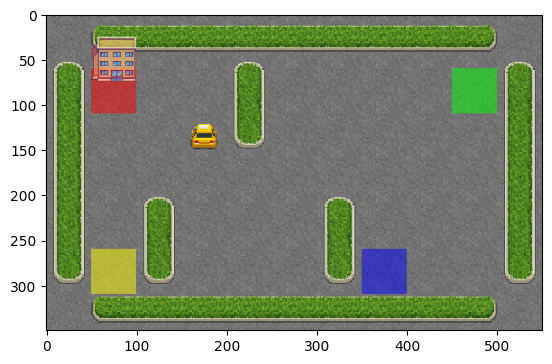


West


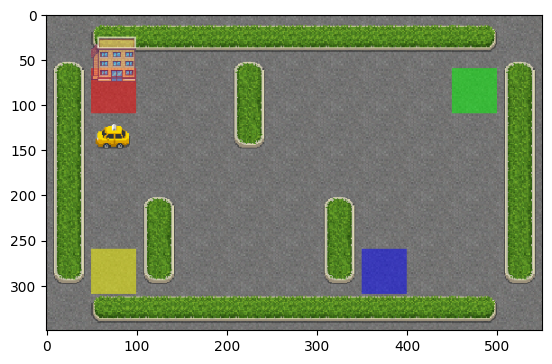


North


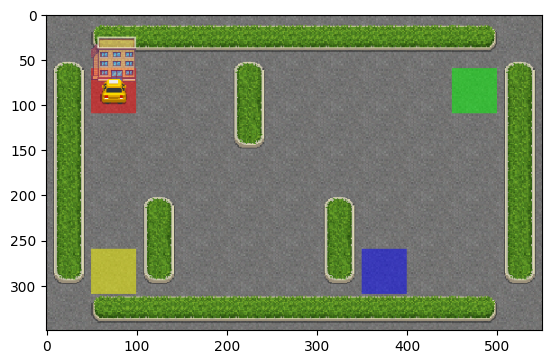


Drop off


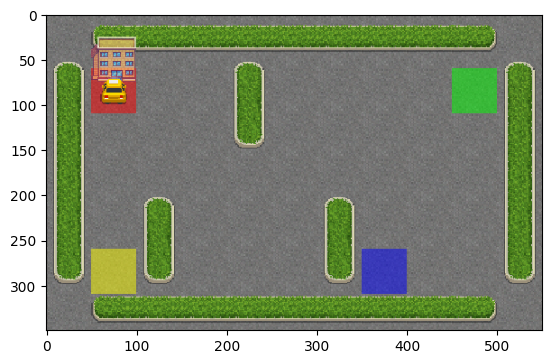

In [6]:
import pandas as pd
import gym
import numpy as np
import matplotlib.pyplot as plt

# Load the Q-table
Q = pd.read_csv('q_learning_q_table.csv').values

# Initialize the environment with RGB array render mode
env = gym.make('Taxi-v3', render_mode='rgb_array')

# Define actions dictionary
actions = {
    0: "South",
    1: "North",
    2: "East",
    3: "West",
    4: "Pick Up",
    5: "Drop off"
}

# Reset the environment to get the initial state
state_info = env.reset()
state = state_info if isinstance(state_info, int) else state_info[0]
done = None

# Run the agent in the environment
while done != True:
    action = np.argmax(Q[state])
    state, reward, done, info, _ = env.step(action)
    output = actions.get(action)
    print(f"\n{output}")
    img = env.render()
    plt.imshow(img)
    plt.show()


## SARSA

Episode: 100, Total Reward: -24
Episode: 200, Total Reward: -70
Episode: 300, Total Reward: -16
Episode: 400, Total Reward: -17
Episode: 500, Total Reward: 11
Episode: 600, Total Reward: 3
Episode: 700, Total Reward: 6
Episode: 800, Total Reward: 7
Episode: 900, Total Reward: 10
Episode: 1000, Total Reward: 9
Episode: 1100, Total Reward: 14
Episode: 1200, Total Reward: 5
Episode: 1300, Total Reward: 4
Episode: 1400, Total Reward: 6
Episode: 1500, Total Reward: 5
Episode: 1600, Total Reward: 5
Episode: 1700, Total Reward: 7
Episode: 1800, Total Reward: 7
Episode: 1900, Total Reward: 4
Episode: 2000, Total Reward: 9
Average reward:7.726
Average steps:13.229


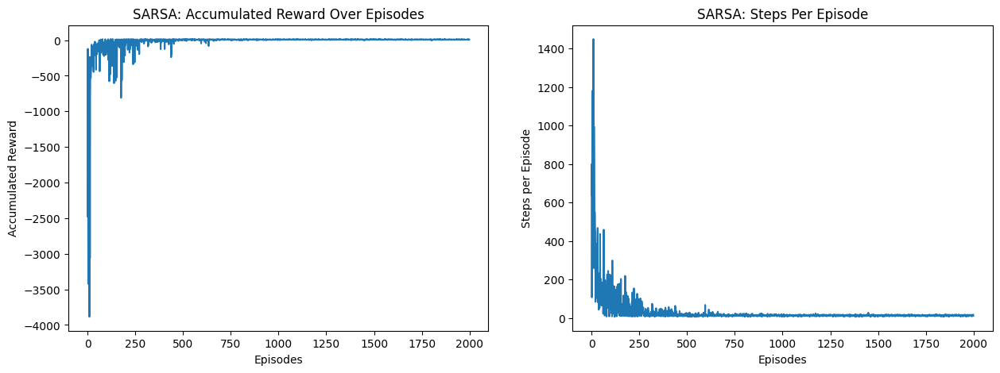

In [7]:
import gym
import numpy as np
import matplotlib.pyplot as plt

# Initialize the environment
env = gym.make('Taxi-v3')
state_size = env.observation_space.n
action_size = env.action_space.n
Q = np.zeros((state_size, action_size))

# Hyperparameters
alpha = 0.3  # Learning rate
gamma = 0.95  # Discount factor
tau = 0.001  # Exploration rate
episodes = 2000  # Number of episodes

# Tracking rewards and steps
rewards = []
steps = []

# Define the epsilon-greedy policy
def epsilon_greedy_action(state, Q, tau):
    if np.random.uniform(0, 1) < tau:
        return env.action_space.sample()
    else:
        return np.argmax(Q[state])

# SARSA function
def update_q_table(Q, state, action, reward, next_state, next_action, alpha, gamma):
    Q[state, action] += alpha * (reward + gamma * Q[next_state, next_action] - Q[state, action])
    return Q

# Train agent
def train_agent(episodes, alpha, gamma, tau, Q):
    rewards = []
    steps = []
    for episode in range(1, episodes + 1):
        state, info = env.reset()
        done = False
        G, reward = 0, 0
        step_count = 0

        # Choose initial action
        action = epsilon_greedy_action(state, Q, tau)

        while not done:
            next_state, reward, done, truncated, info = env.step(action)
            
            # Choose next action
            next_action = epsilon_greedy_action(next_state, Q, tau)

            # Update Q-table
            Q = update_q_table(Q, state, action, reward, next_state, next_action, alpha, gamma)

            G += reward
            state = next_state
            action = next_action
            step_count += 1

        rewards.append(G)
        steps.append(step_count)

        # Logging rewards at intervals
        if episode % 100 == 0:
            print(f"Episode: {episode}, Total Reward: {G}")

    return Q, rewards, steps

# Train the agent and plot results
Q, rewards, steps = train_agent(episodes, alpha, gamma, tau, Q)
print(f"Average reward:{np.mean(rewards[1000:])}")
print(f"Average steps:{np.mean(steps[1000:])}")

# Save Q-table SARSA
pd.DataFrame(Q).to_csv('sarsa_q_table.csv', index=False)

# Plotting the results
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# Plot Accumulated Reward over Episodes
axs[0].plot(range(episodes), rewards)
axs[0].set_xlabel('Episodes')
axs[0].set_ylabel('Accumulated Reward')
axs[0].set_title('SARSA: Accumulated Reward Over Episodes')

# Plot Steps per Episode
axs[1].plot(range(episodes), steps)
axs[1].set_xlabel('Episodes')
axs[1].set_ylabel('Steps per Episode')
axs[1].set_title('SARSA: Steps Per Episode')

plt.show()

## Visualize and Test(ansi)

In [8]:
import pandas as pd
import gym
import numpy as np

# Load the Q-table
Q = pd.read_csv('sarsa_q_table.csv').values

# Initialize the environment
env = gym.make('Taxi-v3', render_mode='ansi')

# Define a function to run and visualize test episodes
def run_and_visualize_test_episodes(env, Q, num_episodes=100, max_visualize_steps=20):
    rewards = []
    steps = []
    for episode in range(num_episodes):
        state, info = env.reset()
        done = False
        total_reward = 0
        step_count = 0

        if episode == 0:
            print(f"Episode {episode + 1}\n{'='*20}")

        while not done:
            action = np.argmax(Q[state])
            next_state, reward, done, truncated, info = env.step(action)
            total_reward += reward
            step_count += 1

            if episode == 0 and step_count <= max_visualize_steps:
                # Render the environment and print the step details
                rendered_env = env.render()
                print(rendered_env)
                print(f"Step: {step_count}")
                print(f"State: {state}, Action: {action}, Reward: {reward}, Total Accumulated Reward: {total_reward}\n")

            state = next_state

        rewards.append(total_reward)
        steps.append(step_count)

        if episode == 0:
            print(f"Total Reward for Episode {episode + 1}: {total_reward}")
            print('='*20)

        print(f"Episode {episode + 1}: Total Reward = {total_reward}")

    # Print average reward and steps
    print(f"Average reward over {num_episodes} episodes: {np.mean(rewards)}")
    print(f"Average steps per episode over {num_episodes} episodes: {np.mean(steps)}")

# Test the SARSA Q-table
print("Testing SARSA Q-table")
run_and_visualize_test_episodes(env, Q)


Testing SARSA Q-table
Episode 1
+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (South)

Step: 1
State: 142, Action: 0, Reward: -1, Total Accumulated Reward: -1

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (West)

Step: 2
State: 242, Action: 3, Reward: -1, Total Accumulated Reward: -2

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (West)

Step: 3
State: 222, Action: 3, Reward: -1, Total Accumulated Reward: -3

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (North)

Step: 4
State: 202, Action: 1, Reward: -1, Total Accumulated Reward: -4

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (North)

Step: 5
State: 102, Action: 1, Reward: -1, Total Accumulated Reward: -5

+---------+
|R: | : :G|
| : | : : |
| : : : : |
| | : | : |
|Y| : |B: |
+---------+
  (Pickup)

Step: 6
State: 2, Action: 4, Rewar

G:\python\python3.10\lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


## Rgb_array Model

Visualizing SARSA agent with RGB array rendering
Episode 1


G:\python\python3.10\lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


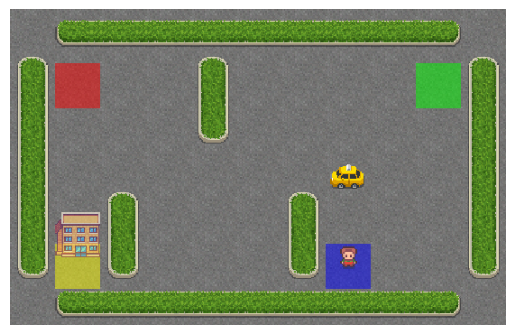

Step: 1
State: 294, Action: 3, Reward: -1, Total Accumulated Reward: -1



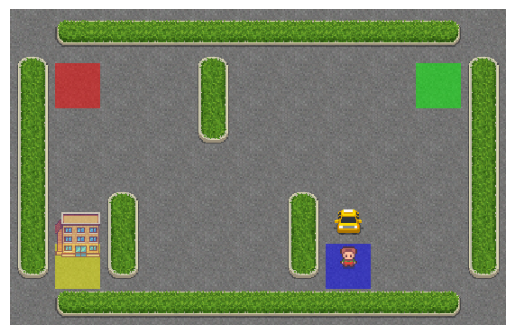

Step: 2
State: 274, Action: 0, Reward: -1, Total Accumulated Reward: -2



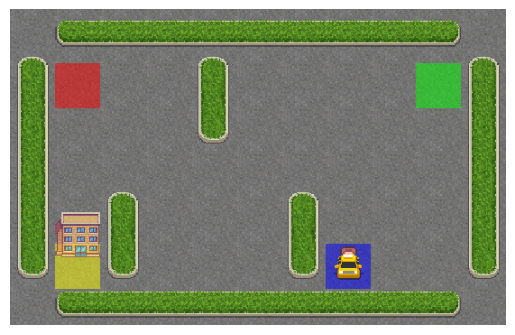

Step: 3
State: 374, Action: 0, Reward: -1, Total Accumulated Reward: -3



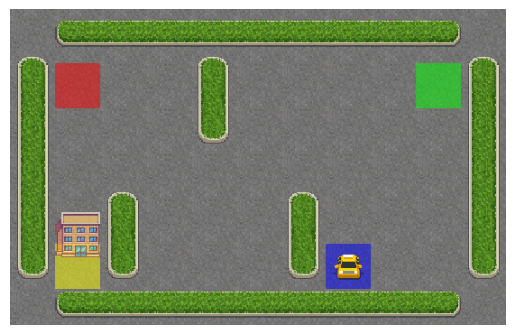

Step: 4
State: 474, Action: 4, Reward: -1, Total Accumulated Reward: -4



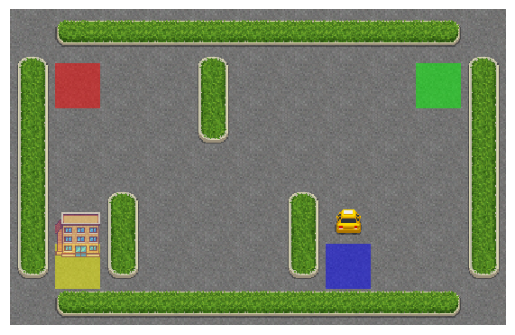

Step: 5
State: 478, Action: 1, Reward: -1, Total Accumulated Reward: -5



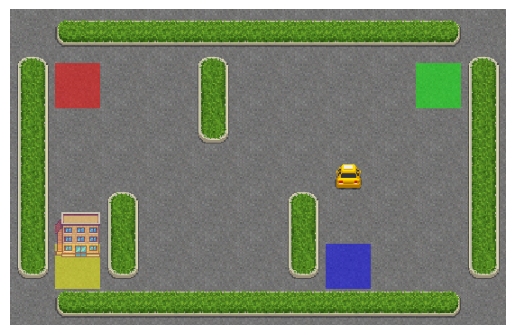

Step: 6
State: 378, Action: 1, Reward: -1, Total Accumulated Reward: -6



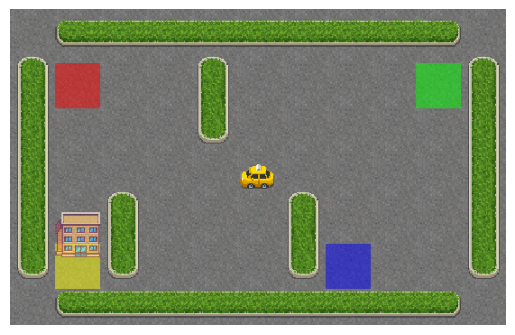

Step: 7
State: 278, Action: 3, Reward: -1, Total Accumulated Reward: -7



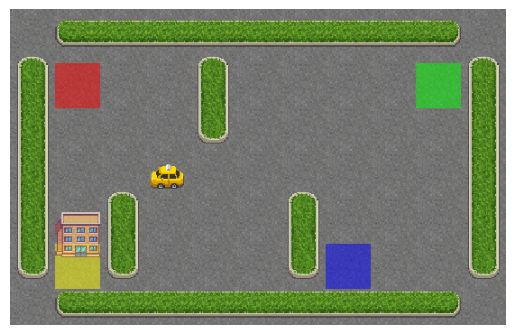

Step: 8
State: 258, Action: 3, Reward: -1, Total Accumulated Reward: -8



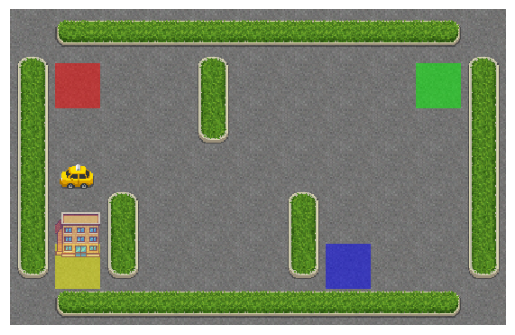

Step: 9
State: 238, Action: 3, Reward: -1, Total Accumulated Reward: -9



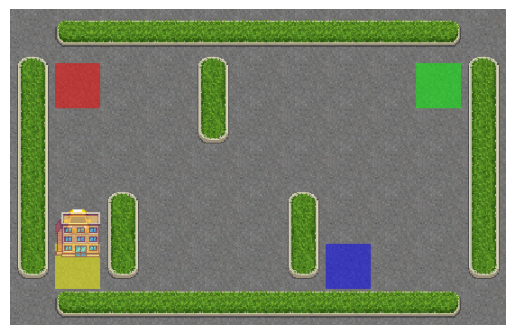

Step: 10
State: 218, Action: 0, Reward: -1, Total Accumulated Reward: -10



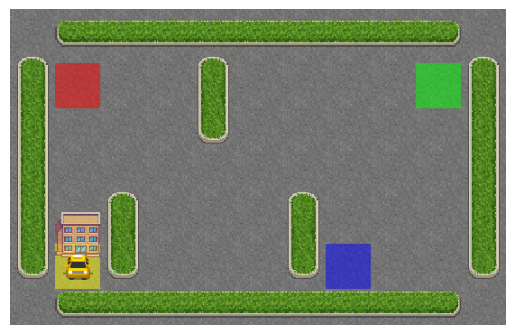

Step: 11
State: 318, Action: 0, Reward: -1, Total Accumulated Reward: -11



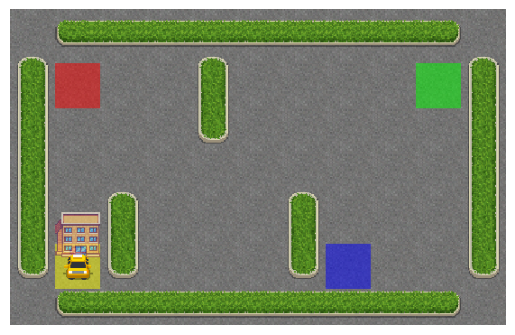

Step: 12
State: 418, Action: 5, Reward: 20, Total Accumulated Reward: 9

Total Reward for Episode 1: 9


In [9]:
import pandas as pd
import gym
import numpy as np
import matplotlib.pyplot as plt

# Load the Q-table
Q = pd.read_csv('sarsa_q_table.csv').values

# Initialize the environment with RGB array render mode
env = gym.make('Taxi-v3', render_mode='rgb_array')

# Define a function to run and visualize test episodes using RGB array
def run_and_visualize_test_episodes_rgb(env, Q, num_episodes=1, max_visualize_steps=20):
    for episode in range(num_episodes):
        state, info = env.reset()
        done = False
        total_reward = 0
        step_count = 0

        print(f"Episode {episode + 1}\n{'='*20}")

        while not done and step_count < max_visualize_steps:
            action = np.argmax(Q[state])
            next_state, reward, done, truncated, info = env.step(action)
            total_reward += reward
            step_count += 1

            # Render the environment and print the step details
            rendered_env = env.render()
            plt.imshow(rendered_env)
            plt.axis('off')  # Hide axes for better visualization
            plt.show()
            print(f"Step: {step_count}")
            print(f"State: {state}, Action: {action}, Reward: {reward}, Total Accumulated Reward: {total_reward}\n")

            state = next_state

        print(f"Total Reward for Episode {episode + 1}: {total_reward}")
        print('='*20)

# Visualize the SARSA agent with RGB array rendering
print("Visualizing SARSA agent with RGB array rendering")
run_and_visualize_test_episodes_rgb(env, Q)
